# Dog vision

In [ ]:
#!unzip '/content/drive/MyDrive/DogVision/dog-breed-identification.zip'

In [ ]:
#!unzip "/content/drive/My Drive/DogVision/dog-breed-identification.zip" -d "/content/drive/My Drive/DogVision/"

# 🐶 End-to-end Multil-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data 

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them). 


In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print('TF version:' , tf.__version__)
print('TF Hub version:' , hub.__version__)

# check for GPU availability
print('GPU', 'available(YESSSSSS)' if tf.config.list_physical_devices('GPU') else 'NO :(')

TF version: 2.6.0
TF Hub version: 0.12.0
GPU available(YESSSSSS)


In [ ]:
import pandas as pd
import numpy as np


In [ ]:
# Getting our data ready (turn images into Tensors)

labels_csv = pd.read_csv ('/content/drive/MyDrive/DogVision/labels.csv')
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,3f5b2f820634bb1f75d4c89627e0e8b7,scottish_deerhound
freq,1,126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


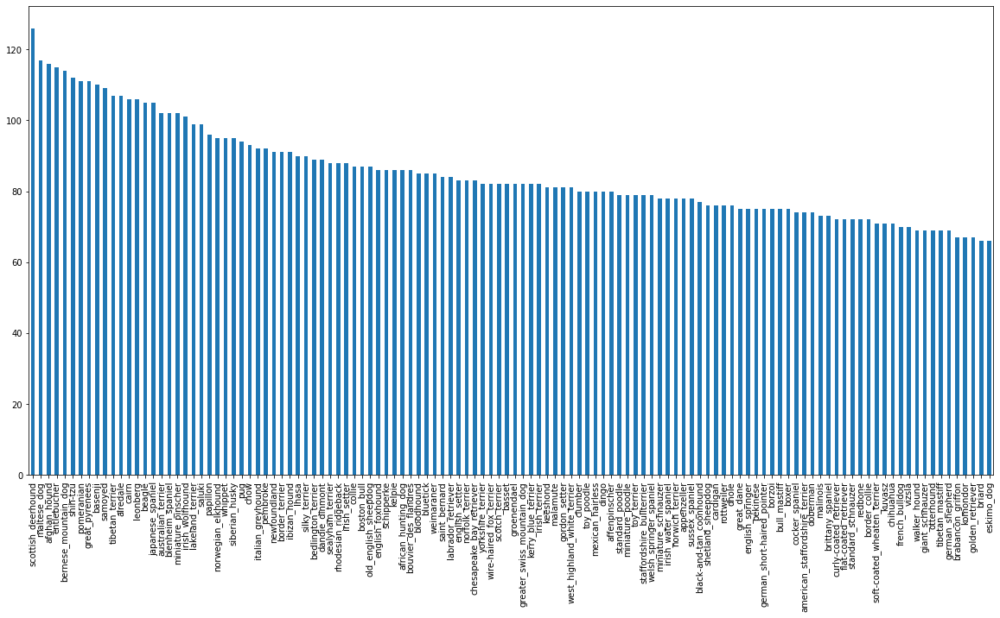

In [ ]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10))

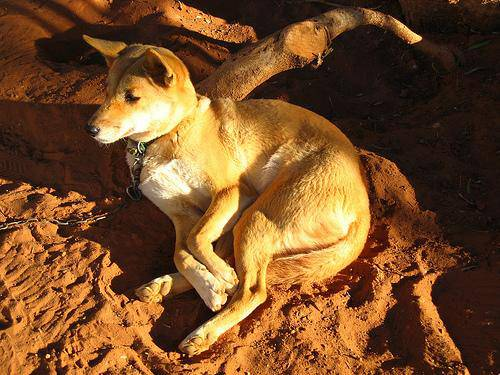

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

Lets get a list of all of our images and image file pathnames

In [ ]:
filenames = ["drive/MyDrive/DogVision/train/"+fname+'.jpg' for fname in labels_csv['id']]

filenames[:10]

['drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
len(os.listdir('drive/MyDrive/DogVision/train'))

10222

In [ ]:
if len(os.listdir('drive/MyDrive/DogVision/train')) == len(filenames):
  print('Good. We have everything in filenames')
else:
  print('No. Check this!')

Good. We have everything in filenames


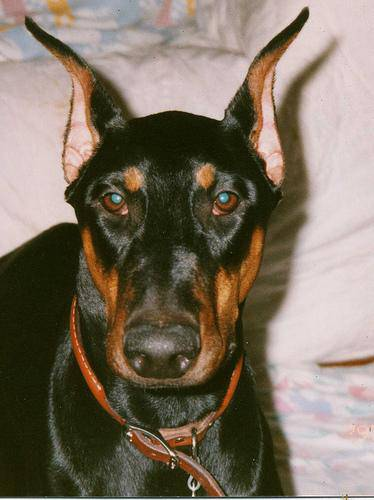

In [ ]:
Image(filenames[9001])

In [ ]:
labels = labels_csv['breed']
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
if len(labels) == len(filenames):
  print('Good')

Good


In [ ]:
unique_breeds = np.unique(labels_csv.breed)

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
labels[0] == unique_breeds

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]

In [ ]:
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Since the Kaggle dataset doesnt include validation -> we ll split our Train in Train + Validation

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X = filenames
y = boolean_labels

print(len(filenames))
print(len(boolean_labels))

10222
10222


In [ ]:
# Reduce it to 1000
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000}


In [ ]:
# split into train and val with total size NUM_IMAGES

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state= 42)

len(X_train), len(y_train), len(X_val), len(y_val) 

(800, 800, 200, 200)

## Turn images into Tensors

1. take an image filepath as input
2. use tf to save it to a variable
3. turn image into tensors and normalize
4. resize image (to the same size = (224,224) )
5. return the modified image

In [ ]:
from matplotlib.pyplot import imread

In [ ]:
# Read as numpy

image = imread(filenames[42])
print(image.shape)
print(image[:2])

(257, 350, 3)
[[[ 89 137  87]
  [ 76 124  74]
  [ 63 111  59]
  ...
  [ 76 134  86]
  [ 76 134  86]
  [ 76 134  86]]

 [[ 72 119  73]
  [ 67 114  68]
  [ 63 111  63]
  ...
  [ 75 131  84]
  [ 74 132  84]
  [ 74 131  86]]]


In [ ]:
# turn image into a tensor - able to run on a GPU
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [ ]:
# define Image size
IMG_SIZE = 224

def process_image(image_path, img_size=IMG_SIZE):
  '''
  Takes an image filepath and turns it into a tensor
  '''

  # read the image
  image = tf.io.read_file(image_path)

  # turn the jpg image into numerical Tensor with 3 colours
  image = tf.image.decode_jpeg(image, channels=3)

  # normalization (0,255) -> (0,1)
  image = tf.image.convert_image_dtype(image, tf.float32)

  #resize image
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

In [ ]:
# Test the code

image = tf.io.read_file(filenames[0])

tensor = tf.image.decode_jpeg(image, channels = 3)

tensor = tf.image.convert_image_dtype(tensor, tf.float32)

In [ ]:
testimg = process_image(filenames[0])
testimg[:2]

<tf.Tensor: shape=(2, 224, 3), dtype=float32, numpy=
array([[[0.5705322 , 0.33588538, 0.15008473],
        [0.66901225, 0.4601166 , 0.26022965],
        [0.61062384, 0.43763596, 0.21601713],
        ...,
        [0.8182312 , 0.7297958 , 0.26963907],
        [0.72454786, 0.6059109 , 0.2653059 ],
        [0.7494603 , 0.6252918 , 0.32456532]],

       [[0.6761415 , 0.4733761 , 0.30642927],
        [0.5672121 , 0.38192675, 0.20349538],
        [0.5883547 , 0.4322571 , 0.2403155 ],
        ...,
        [0.9326942 , 0.8260503 , 0.41093278],
        [0.86072475, 0.74250627, 0.3694122 ],
        [0.76781666, 0.6461604 , 0.29291284]]], dtype=float32)>

## Create baches (mini-batch)

Why?
**Lets say you are trying to process 10k images in one-go: They may NOT fit all in memory (RAM)**

--> TensorFlow tuples:
`(image, label)`

In [ ]:
# Create a function that returns a tuple

def get_image_label(image_path, label):
  image = process_image(image_path)
  
  return image, label

In [ ]:
# Lets make a function that turns data into batches

BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creates batches of data out of image (X) and label (y) pairs
  Shuffles the data if its training data, do not shuffle if its validation
  Also accept test data
  '''

  #If the data is test dataset, we dont have labels
  if test_data:
    print('Creating test data batches...')

    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) #only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)

    return data_batch
  
  elif valid_data:
    print('Creating validation data batches...')

    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                               tf.constant(y))) # labels

    # use the function get_image_label instead of process_image because we need a tuple that includes also the label
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)

    return data_batch

  else: #training batch -> we need to shuffle it
    print('Creating training data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    
    # Shuffling pathnames is faster than shuffling images
    data = data.shuffle(buffer_size=len(X)) #shuffle all

    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)

    return data_batch

In [ ]:
# Create train and validation data 
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)


Creating training data batches...
Creating validation data batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches


In [ ]:
import matplotlib.pyplot as plt


In [ ]:
def show_25_images(images, y):
  plt.figure(figsize=(20,20))

  for i in range(25):
    ax = plt.subplot(5, 5, i+1)

    plt.imshow(images[i])
    plt.title(unique_breeds[y[i].argmax()])

    plt.axis('off')

In [ ]:
train_data


<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# unbatch data by turning it into an iterator
train_images, train_labels = next(train_data.as_numpy_iterator())

len(train_images), len(train_labels)

(32, 32)

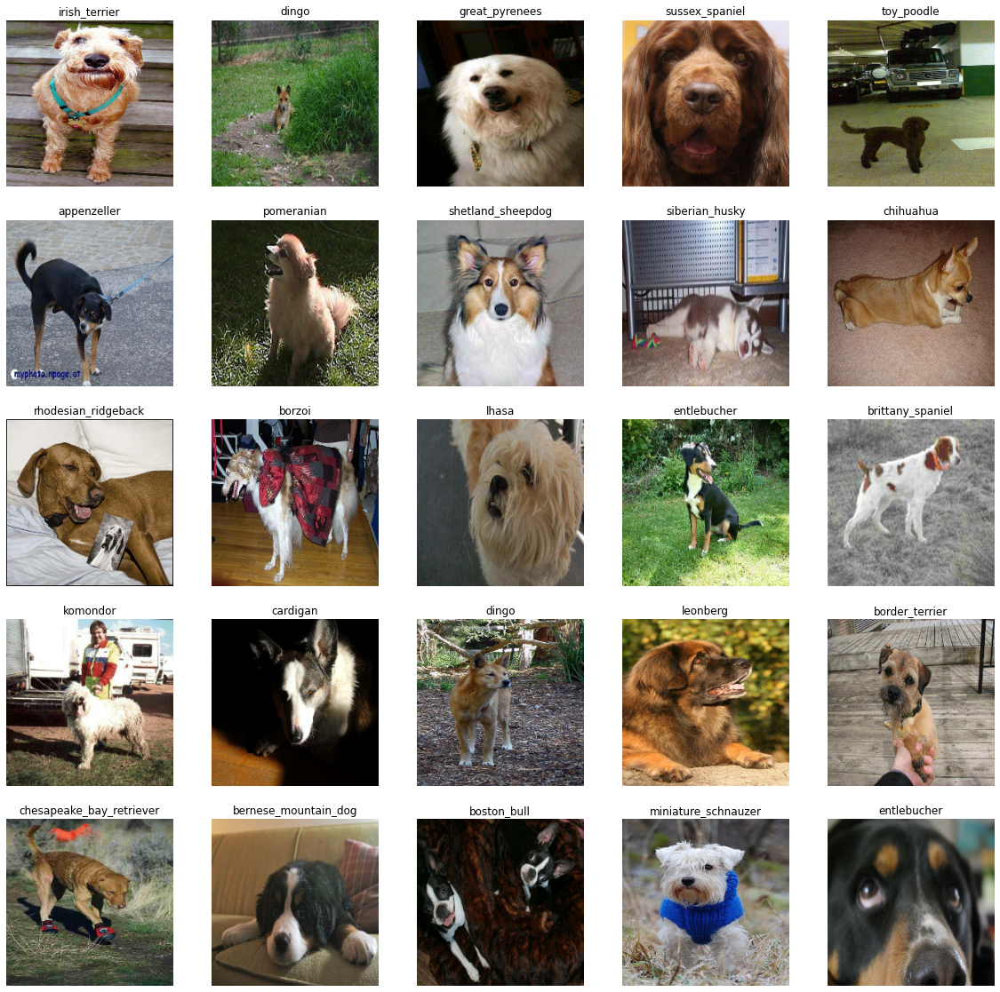

In [ ]:
# everytime we run this, there will be a different output (because it is training data, it is shuffled)
train_images, train_labels = next(train_data.as_numpy_iterator())

show_25_images(train_images, train_labels)

## Build the model

We will use Transfer Learning. Once we have good results, we will improve on that model

Before that, we need to define:

* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4



In [ ]:
# input shape
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# output shape
OUTPUT_SHAPE = len(unique_breeds)

# Model URL from Tensorflow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

In [ ]:
from tensorflow import keras
from keras import layers

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [ ]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):

  print('Build model with', model_url)

  model = tf.keras.Sequential([
                               hub.KerasLayer(model_url),
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                                                     activation='softmax')
  ])

  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()

Build model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### Creating callbacks

1. TensorBoard - track progress
2. Stop training after stopping to improve

In [ ]:
#Load tensorboard
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/DogVision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
# Early stopping function - prevents overfitting

early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3) #stops improving for 3 epochs


# Train a model

The first model will be trained on 1000 images.

In [ ]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100}

In [ ]:
### check GPU

print('GPU:', 'YES' if tf.config.list_physical_devices('GPU') else 'NO')

GPU: YES


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
def train_model():
  model = create_model()

  #everytime we call train_model(), we create a log file
  tensorboard= create_tensorboard_callback()

  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, #test each epoch what we learned
            callbacks = [tensorboard, early_stopping])
  
  return model

In [ ]:
model = train_model()

Build model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 276s 10s/step - loss: 4.6801 - accuracy: 0.0825 - val_loss: 3.6324 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 4s 158ms/step - loss: 1.6803 - accuracy: 0.6725 - val_loss: 2.2569 - val_accuracy: 0.4700
Epoch 3/100
25/25 [==============================] - 4s 156ms/step - loss: 0.5862 - accuracy: 0.9300 - val_loss: 1.7492 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 4s 157ms/step - loss: 0.2577 - accuracy: 0.9825 - val_loss: 1.5651 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 4s 172ms/step - loss: 0.1495 - accuracy: 0.9962 - val_loss: 1.4754 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 4s 154ms/step - loss: 0.1026 - accuracy: 1.0000 - val_loss: 1.4400 - val_accuracy: 0.6300
Epoch 7/100
25/25 [==============================] - 

**Question:** Looks like our model is overfitting. What should we do?


## Check the log files



In [ ]:
# Tensorboard magic function will allows us to visualize this

%tensorboard --logdir drive/MyDrive/DogVision/logs

<IPython.core.display.Javascript object>

### If we have multiple log files (multiple models), we can compare their performance using TensorBoard.

# Making and evaluating predictions using a trained model

In [ ]:
# make predictions

predictions = model.predict(val_data, verbose=1)

7/7 [==============================] - 1s 112ms/step


In [ ]:
predictions.shape

(200, 120)

In [ ]:
# sum all the probabilities, should be == 1 <- 'softmax'
np.sum(predictions[0])

0.9999999

In [ ]:
index = 42

print(predictions[index])
print(f'Max value: {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[1.88673348e-05 4.09470667e-04 5.45076691e-05 1.01282776e-05
 1.45224226e-03 6.69358196e-05 1.34175119e-04 2.16867702e-04
 1.51855676e-02 3.11814696e-02 1.51705055e-04 1.32891537e-05
 5.76162245e-04 3.44687700e-03 1.52978103e-03 2.41989829e-03
 3.83404404e-05 5.40522684e-04 1.53890665e-04 7.40875257e-04
 2.75023456e-04 4.48096689e-04 9.67494125e-05 3.82228500e-05
 7.11103249e-03 1.29028806e-04 3.69075933e-05 6.22428197e-05
 6.94126298e-04 1.85076584e-04 1.51820976e-04 2.46904150e-04
 7.42043412e-05 3.35858094e-05 3.06800139e-05 6.16012767e-05
 1.06646352e-04 8.31053592e-04 1.90347982e-05 3.17005664e-01
 3.03713081e-04 3.13477831e-05 3.37600429e-03 2.61854839e-05
 5.42339694e-04 6.03774897e-05 5.27745520e-04 8.47854477e-04
 5.38613858e-05 3.15725774e-04 6.08222508e-05 7.90059348e-05
 3.20687483e-04 2.63130921e-03 3.84308951e-05 4.67483042e-04
 1.43096040e-04 1.28259213e-04 3.72234317e-05 2.44500347e-06
 3.64295120e-04 6.28429407e-04 1.00319539e-05 7.39336538e-05
 1.99048955e-04 1.215289

# Inspect visually the predictions

**NOTE** prediction probabilities = confidence levels

In [ ]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[ np.argmax(prediction_probabilities) ]


pred_label = get_pred_label(predictions[42])
pred_label

'walker_hound'

In [ ]:
get_pred_label(labels[0])

'affenpinscher'

In [ ]:
get_pred_label(predictions[0])

'cairn'

In [ ]:
def unbatchify(data):
  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

In [ ]:
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # get predicted label
  pred_label = get_pred_label(pred_prob)

  # plot image
  plt.imshow(image)
  #turns off the axis
  plt.xticks([])
  plt.yticks([])

  #change the colour of the title depending on if the prediction is right/wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label), color = color
  )


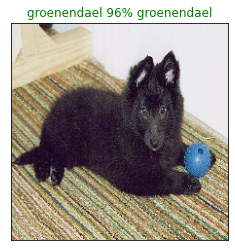

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels = val_labels,
          images = val_images,
          n = 77)

Top 10 predictions for a given image

In [ ]:
#top 10 predictions by value 
predictions[0].argsort()[-10:][::-1]

array([ 26,  17,  59, 103,  77,  73, 102,  65,  83,  68])

In [ ]:
predictions[0][17], predictions[0][100]

(0.13324377, 0.012526996)

In [ ]:
predictions[0][ predictions[0].argsort()[-10:][::-1]]

array([0.5621694 , 0.13324377, 0.03638175, 0.03489063, 0.02763392,
       0.01902271, 0.01885481, 0.01845953, 0.01743677, 0.0161241 ],
      dtype=float32)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  '''
  Plot top 10 predictions
  '''

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  pred_label = get_pred_label(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1 ]
  top_10_pred_values = pred_prob[ top_10_pred_indexes ]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = 'grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation='vertical')
  
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

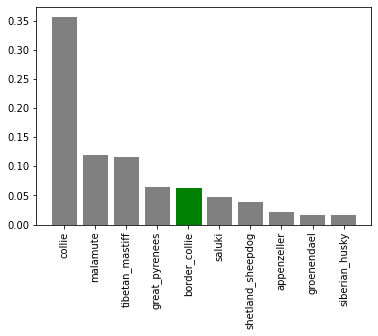

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

## Create subplots with top 10 confidences

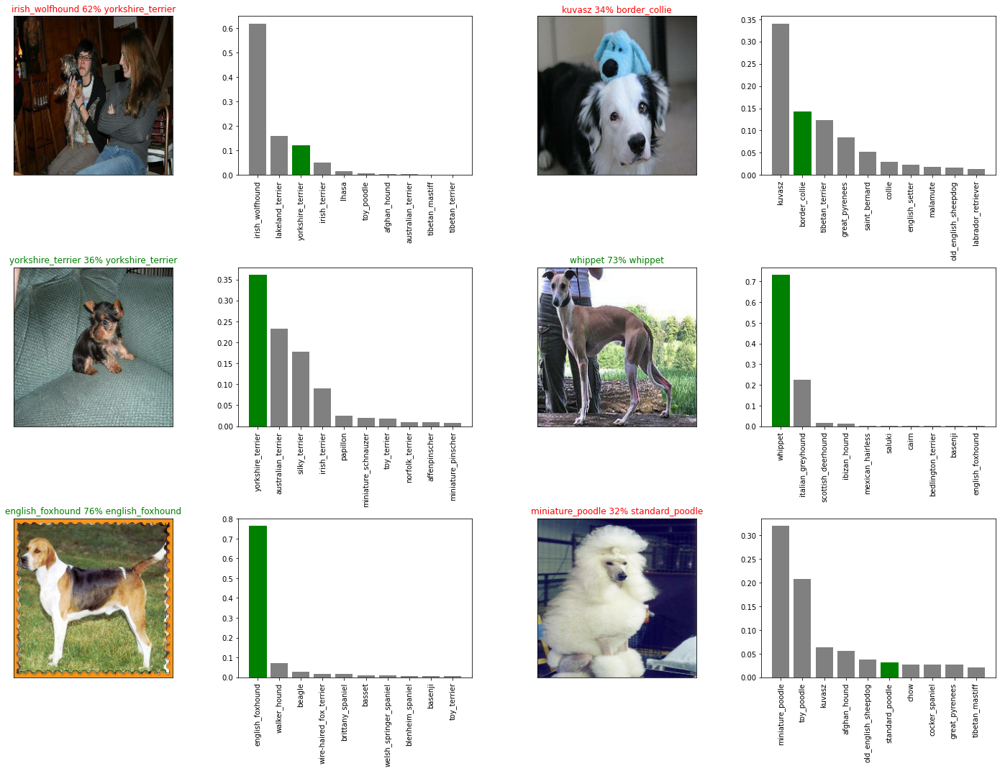

In [ ]:
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols

plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i + 1)
  plot_pred(prediction_probabilities=predictions,
            labels = val_labels,
            images = val_images,
            n = i+i_multiplier)
  
  plt.subplot(num_rows, 2*num_cols, 2*i + 2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels = val_labels,
                 n = i+i_multiplier)
plt.tight_layout()
plt.show()

# Saving and reloading a model

In [ ]:
def save_model(model, suffix=None):

  modeldir = os.path.join('drive/MyDrive/DogVision/models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  model_path = modeldir + '-' + suffix + '.h5'
  print(f'Saving model to {model_path}')
  model.save(model_path)

  return model_path



In [ ]:
def load_model(model_path):

  print(f'Loading model from {model_path}')

  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer':hub.KerasLayer})
  
  return model

In [ ]:
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to drive/MyDrive/DogVision/models/20210818-224553-1000-images-mobilenetv2-Adam.h5


'drive/MyDrive/DogVision/models/20210818-224553-1000-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_1000_image_model = load_model('drive/MyDrive/DogVision/models/20210818-20431629319413-1000-images-mobilenetv2-Adam.h5')

Loading model from drive/MyDrive/DogVision/models/20210818-20431629319413-1000-images-mobilenetv2-Adam.h5


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 106ms/step - loss: 1.3422 - accuracy: 0.6500


[1.3421695232391357, 0.6499999761581421]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 106ms/step - loss: 1.1835 - accuracy: 0.6700


[1.1835170984268188, 0.6700000166893005]

# Big Model (full dataset)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
full_model = create_model()

Build model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
 full_model_tensorboard = create_tensorboard_callback()

 # No validation set -> we cant monitor validation accuracy
 full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy' # instead of monitor = 'val_accuracy'
                                              , patience=3) 

In [ ]:
 # # We wont run -> it will take very long
# full_model.fit(x=full_data,
#                epochs = NUM_EPOCHS,
#                callbacks=[full_model_tensorboard, full_model_early_stopping])
